In [1]:
%load_ext autoreload
%autoreload 2

import numpy as np
import pandas as pd 
pd.set_option('display.max_columns', None)
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from hyperparameter_tuning import *

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
import os
# os.environ['DYLD_LIBRARY_PATH'] = '/usr/local/opt/homebrew/opt/libomp/lib'
import lightgbm as lgb

In [4]:
X_data_player_away=pd.read_csv('Train_Data/train_away_player_statistics_df.csv',index_col='ID')
X_data_player_home=pd.read_csv('Train_Data/train_home_player_statistics_df.csv',index_col='ID')

In [5]:
X_data_team_away=pd.read_csv('Train_Data/train_away_team_statistics_df.csv',index_col='ID')
X_data_team_home=pd.read_csv('Train_Data/train_home_team_statistics_df.csv',index_col='ID')

In [6]:
X_data_team_home

,LEAGUE,TEAM_NAME,TEAM_SHOTS_TOTAL_season_sum,TEAM_SHOTS_INSIDEBOX_season_sum,TEAM_SHOTS_OFF_TARGET_season_sum,TEAM_SHOTS_ON_TARGET_season_sum,TEAM_SHOTS_OUTSIDEBOX_season_sum,TEAM_PASSES_season_sum,TEAM_SUCCESSFUL_PASSES_season_sum,TEAM_SAVES_season_sum,TEAM_CORNERS_season_sum,TEAM_FOULS_season_sum,TEAM_YELLOWCARDS_season_sum,TEAM_REDCARDS_season_sum,TEAM_OFFSIDES_season_sum,TEAM_ATTACKS_season_sum,TEAM_PENALTIES_season_sum,TEAM_SUBSTITUTIONS_season_sum,TEAM_BALL_SAFE_season_sum,TEAM_DANGEROUS_ATTACKS_season_sum,TEAM_INJURIES_season_sum,TEAM_GOALS_season_sum,TEAM_GAME_WON_season_sum,TEAM_GAME_DRAW_season_sum,TEAM_GAME_LOST_season_sum,TEAM_SHOTS_TOTAL_season_average,TEAM_SHOTS_INSIDEBOX_season_average,TEAM_SHOTS_OFF_TARGET_season_average,TEAM_SHOTS_ON_TARGET_season_average,TEAM_SHOTS_OUTSIDEBOX_season_average,TEAM_PASSES_season_average,TEAM_SUCCESSFUL_PASSES_season_average,TEAM_SUCCESSFUL_PASSES_PERCENTAGE_season_average,TEAM_SAVES_season_average,TEAM_CORNERS_season_average,TEAM_BALL_POSSESSION_season_average,TEAM_FOULS_season_average,TEAM_YELLOWCARDS_season_average,TEAM_REDCARDS_season_average,TEAM_OFFSIDES_season_average,TEAM_ATTACKS_season_average,TEAM_PENALTIES_season_average,TEAM_SUBSTITUTIONS_season_average,TEAM_BALL_SAFE_season_average,TEAM_DANGEROUS_ATTACKS_season_average,TEAM_INJURIES_season_average,TEAM_GOALS_season_average,TEAM_GAME_WON_season_average,TEAM_GAME_DRAW_season_average,TEAM_GAME_LOST_season_average,TEAM_SHOTS_TOTAL_season_std,TEAM_SHOTS_INSIDEBOX_season_std,TEAM_SHOTS_OFF_TARGET_season_std,TEAM_SHOTS_ON_TARGET_season_std,TEAM_SHOTS_OUTSIDEBOX_season_std,TEAM_PASSES_season_std,TEAM_SUCCESSFUL_PASSES_season_std,TEAM_SUCCESSFUL_PASSES_PERCENTAGE_season_std,TEAM_SAVES_season_std,TEAM_CORNERS_season_std,TEAM_BALL_POSSESSION_season_std,TEAM_FOULS_season_std,TEAM_YELLOWCARDS_season_std,TEAM_REDCARDS_season_std,TEAM_OFFSIDES_season_std,TEAM_ATTACKS_season_std,TEAM_PENALTIES_season_std,TEAM_SUBSTITUTIONS_season_std,TEAM_BALL_SAFE_season_std,TEAM_DANGEROUS_ATTACKS_season_std,TEAM_INJURIES_season_std,TEAM_GOALS_season_std,TEAM_SHOTS_TOTAL_5_last_match_sum,TEAM_SHOTS_INSIDEBOX_5_last_match_sum,TEAM_SHOTS_OFF_TARGET_5_last_match_sum,TEAM_SHOTS_ON_TARGET_5_last_match_sum,TEAM_SHOTS_OUTSIDEBOX_5_last_match_sum,TEAM_PASSES_5_last_match_sum,TEAM_SUCCESSFUL_PASSES_5_last_match_sum,TEAM_SAVES_5_last_match_sum,TEAM_CORNERS_5_last_match_sum,TEAM_FOULS_5_last_match_sum,TEAM_YELLOWCARDS_5_last_match_sum,TEAM_REDCARDS_5_last_match_sum,TEAM_OFFSIDES_5_last_match_sum,TEAM_ATTACKS_5_last_match_sum,TEAM_PENALTIES_5_last_match_sum,TEAM_SUBSTITUTIONS_5_last_match_sum,TEAM_BALL_SAFE_5_last_match_sum,TEAM_DANGEROUS_ATTACKS_5_last_match_sum,TEAM_INJURIES_5_last_match_sum,TEAM_GOALS_5_last_match_sum,TEAM_GAME_WON_5_last_match_sum,TEAM_GAME_DRAW_5_last_match_sum,TEAM_GAME_LOST_5_last_match_sum,TEAM_SHOTS_TOTAL_5_last_match_average,TEAM_SHOTS_INSIDEBOX_5_last_match_average,TEAM_SHOTS_OFF_TARGET_5_last_match_average,TEAM_SHOTS_ON_TARGET_5_last_match_average,TEAM_SHOTS_OUTSIDEBOX_5_last_match_average,TEAM_PASSES_5_last_match_average,TEAM_SUCCESSFUL_PASSES_5_last_match_average,TEAM_SUCCESSFUL_PASSES_PERCENTAGE_5_last_match_average,TEAM_SAVES_5_last_match_average,TEAM_CORNERS_5_last_match_average,TEAM_BALL_POSSESSION_5_last_match_average,TEAM_FOULS_5_last_match_average,TEAM_YELLOWCARDS_5_last_match_average,TEAM_REDCARDS_5_last_match_average,TEAM_OFFSIDES_5_last_match_average,TEAM_ATTACKS_5_last_match_average,TEAM_PENALTIES_5_last_match_average,TEAM_SUBSTITUTIONS_5_last_match_average,TEAM_BALL_SAFE_5_last_match_average,TEAM_DANGEROUS_ATTACKS_5_last_match_average,TEAM_INJURIES_5_last_match_average,TEAM_GOALS_5_last_match_average,TEAM_GAME_WON_5_last_match_average,TEAM_GAME_DRAW_5_last_match_average,TEAM_GAME_LOST_5_last_match_average,TEAM_SHOTS_TOTAL_5_last_match_std,TEAM_SHOTS_INSIDEBOX_5_last_match_std,TEAM_SHOTS_OFF_TARGET_5_last_match_std,TEAM_SHOTS_ON_TARGET_5_last_match_std,TEAM_SHOTS_OUTSIDEBOX_5_last_match_std,TEAM_PASSES_5_last_match_st

In [10]:
X_data_player_away_test=pd.read_csv('Test_Data/test_away_player_statistics_df.csv',index_col='ID')
X_data_player_home_test=pd.read_csv('Test_Data/test_home_player_statistics_df.csv',index_col='ID')

In [11]:
X_data_team_away_test=pd.read_csv('Test_Data/test_away_team_statistics_df.csv',index_col='ID')
X_data_team_home_test=pd.read_csv('Test_Data/test_home_team_statistics_df.csv',index_col='ID')

In [18]:
Y_data_train=pd.read_csv('Y_train_1rknArQ.csv',index_col='ID') 
Y_data_train_score=pd.read_csv(r'data/Y_train_supp.csv',index_col='ID') 

In [19]:
def calculate_nan_percentage(dataframe):
    # Count the number of NaN values in each column
    nan_counts = dataframe.isna().sum()

    # Calculate the percentage of NaN values in each column
    nan_percentage = (nan_counts / len(dataframe)) * 100

    return nan_percentage.sort_values(ascending=False)

### ID C'EST POUR LE MATCH

<Axes: >

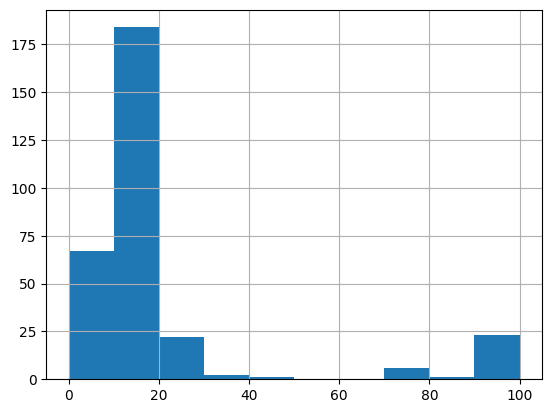

In [20]:
nan_value_X_data_player_home=calculate_nan_percentage(X_data_player_home)
nan_value_X_data_player_home.hist()

### Plus de 20% je drop la colonne 
### En dessous je drop la ligne, surement le joueur n'est pas relevant

In [21]:
columns_to_drop_X_data_player_home=list(nan_value_X_data_player_home[nan_value_X_data_player_home>40].index)+['POSITION']
                                                                                                              

In [54]:
calculate_nan_percentage(X_data_player_home_nonancol[X_data_player_home["POSITION"]=="goalkeeper"])
                         

PLAYER_ACCURATE_PASSES_PERCENTAGE_5_last_match_average    54.732900
PLAYER_ACCURATE_PASSES_PERCENTAGE_season_std              52.489917
PLAYER_ACCURATE_PASSES_PERCENTAGE_season_average          46.267182
PLAYER_PENALTIES_SAVED_5_last_match_std                   21.643757
PLAYER_PENALTIES_SAVED_5_last_match_average               20.569594
                                                            ...    
PLAYER_MINUTES_PLAYED_5_last_match_sum                     1.461026
PLAYER_PENALTIES_SCORED_5_last_match_sum                   1.461026
PLAYER_STARTING_LINEUP_5_last_match_sum                    1.461026
PLAYER_YELLOWCARDS_5_last_match_sum                        1.461026
PLAYER_YELLOWCARDS_5_last_match_average                    1.461026
Length: 271, dtype: float64

In [22]:
X_data_player_home_nonancol=X_data_player_home.drop(columns=columns_to_drop_X_data_player_home+['LEAGUE','TEAM_NAME','PLAYER_NAME'],axis=1)
X_data_player_home_preproc=X_data_player_home_nonancol.fillna(0).groupby('ID').mean()

In [23]:
X_data_player_home_nonancol_test=X_data_player_home_test.drop(columns=columns_to_drop_X_data_player_home,axis=1)
X_data_player_home_preproc_test=X_data_player_home_nonancol_test.fillna(0).groupby('ID').mean()

In [24]:
nan_value_X_data_team_home=calculate_nan_percentage(X_data_team_home)
nan_value_X_data_team_home

TEAM_INJURIES_5_last_match_std                26.969032
TEAM_INJURIES_5_last_match_sum                23.831586
TEAM_INJURIES_5_last_match_average            23.823458
TEAM_INJURIES_season_std                      23.766561
TEAM_INJURIES_season_sum                      15.931074
                                                ...    
TEAM_ATTACKS_5_last_match_sum                  0.000000
TEAM_ATTACKS_5_last_match_average              0.000000
TEAM_DANGEROUS_ATTACKS_5_last_match_sum        0.000000
TEAM_SHOTS_OFF_TARGET_5_last_match_average     0.000000
LEAGUE                                         0.000000
Length: 142, dtype: float64

### Je vais fill avec des 0, mais c'est très discutable

In [25]:
X_data_team_home_filled=X_data_team_home.fillna(0)

In [26]:
X_data_team_home_filled_test=X_data_team_home_test.fillna(0)

In [27]:
X_data_home_prepoc=pd.merge(X_data_team_home_filled, X_data_player_home_preproc, left_index=True, right_index=True).drop(columns=['LEAGUE','TEAM_NAME'],axis=1)  


In [28]:
X_data_home_prepoc_test=pd.merge(X_data_team_home_filled_test, X_data_player_home_preproc_test, left_index=True, right_index=True).drop(columns=['LEAGUE','TEAM_NAME'],axis=1,errors='ignore')  


In [29]:
sum_columns=[col for col in X_data_home_prepoc.columns if 'sum' in col]
# std_columns=[col for col in X_data_home_prepoc.columns if 'std' in col]
avg_columns=[col for col in X_data_home_prepoc.columns if 'average' in col]

In [30]:
# for col in sum_columns: # J'ai check si tous les radicaux, radicaux_sum sont dans radicaux_avg
#     if col not in avg_columns:
#         print(col)

In [31]:
X_data_home_prepoc_nosum=X_data_home_prepoc.drop(columns=sum_columns,axis=1)

In [32]:
X_data_home_prepoc_test_nosum=X_data_home_prepoc_test.drop(columns=sum_columns,axis=1)

In [34]:
corr_matrix = X_data_home_prepoc_nosum.corr()


In [35]:
corr_matrix.style.background_gradient(cmap='coolwarm')

In [36]:
columns=list(corr_matrix.columns)
corr_col=set()
visited=set()
for col1 in columns:
    if col1 not in visited:
        for col2 in columns:
            if col2 not in visited:
                if col1!=col2:
                    value=abs(np.round(corr_matrix.loc[col1,col2],2))
                    if value>=0.9:
                        print(f"{col1} with std {np.round(np.std(X_data_home_prepoc_test[col1]),2)} is highly correlated with {col2} with std {np.round(np.std(X_data_home_prepoc_test[col2]),2)} and correlation {value}\n")
                        if 'SUCCESSFUL' not in col1 or 'std' in col1:
                            corr_col.add(col1)
                        else:
                            corr_col.add(col2)
                        visited.add(col2)
    visited.add(col1)

TEAM_PASSES_season_average with std 2.87 is highly correlated with TEAM_SUCCESSFUL_PASSES_season_average with std 2.86 and correlation 0.97

TEAM_PASSES_season_std with std 2.87 is highly correlated with TEAM_SUCCESSFUL_PASSES_season_std with std 2.87 and correlation 0.94

TEAM_PASSES_5_last_match_average with std 2.87 is highly correlated with TEAM_SUCCESSFUL_PASSES_5_last_match_average with std 2.88 and correlation 0.98

TEAM_REDCARDS_5_last_match_average with std 3.54 is highly correlated with TEAM_REDCARDS_5_last_match_std with std 3.85 and correlation 0.93

TEAM_PASSES_5_last_match_std with std 2.9 is highly correlated with TEAM_SUCCESSFUL_PASSES_5_last_match_std with std 2.91 and correlation 0.94

PLAYER_ACCURATE_CROSSES_season_average with std 3.26 is highly correlated with PLAYER_TOTAL_CROSSES_season_average with std 3.57 and correlation 0.9

PLAYER_ACCURATE_PASSES_season_average with std 8.0 is highly correlated with PLAYER_PASSES_season_average with std 8.29 and correlation 0

In [37]:
len(corr_col)

54

In [42]:
X_data_home_prepoc_nosum_nocorr=X_data_home_prepoc_nosum.drop(columns=list(corr_col),axis=1)

In [43]:
X_data_home_prepoc_test_nosum_nocorr=X_data_home_prepoc_test_nosum.drop(columns=list(corr_col),axis=1)

In [44]:
corr_matrix2 = X_data_home_prepoc_nosum_nocorr.corr()
corr_matrix2.style.background_gradient(cmap='coolwarm')

In [45]:
X_data_home_prepoc_nosum_nocorr

,TEAM_SHOTS_TOTAL_season_average,TEAM_SHOTS_INSIDEBOX_season_average,TEAM_SHOTS_OFF_TARGET_season_average,TEAM_SHOTS_ON_TARGET_season_average,TEAM_SHOTS_OUTSIDEBOX_season_average,TEAM_SUCCESSFUL_PASSES_season_average,TEAM_SUCCESSFUL_PASSES_PERCENTAGE_season_average,TEAM_SAVES_season_average,TEAM_CORNERS_season_average,TEAM_BALL_POSSESSION_season_average,TEAM_FOULS_season_average,TEAM_YELLOWCARDS_season_average,TEAM_REDCARDS_season_average,TEAM_OFFSIDES_season_average,TEAM_ATTACKS_season_average,TEAM_PENALTIES_season_average,TEAM_SUBSTITUTIONS_season_average,TEAM_BALL_SAFE_season_average,TEAM_DANGEROUS_ATTACKS_season_average,TEAM_INJURIES_season_average,TEAM_GOALS_season_average,TEAM_GAME_WON_season_average,TEAM_GAME_DRAW_season_average,TEAM_GAME_LOST_season_average,TEAM_SHOTS_TOTAL_season_std,TEAM_SHOTS_INSIDEBOX_season_std,TEAM_SHOTS_OFF_TARGET_season_std,TEAM_SHOTS_ON_TARGET_season_std,TEAM_SHOTS_OUTSIDEBOX_season_std,TEAM_SUCCESSFUL_PASSES_season_std,TEAM_SUCCESSFUL_PASSES_PERCENTAGE_season_std,TEAM_SAVES_season_std,TEAM_CORNERS_season_std,TEAM_BALL_POSSESSION_season_std,TEAM_FOULS_season_std,TEAM_YELLOWCARDS_season_std,TEAM_REDCARDS_season_std,TEAM_OFFSIDES_season_std,TEAM_ATTACKS_season_std,TEAM_PENALTIES_season_std,TEAM_SUBSTITUTIONS_season_std,TEAM_BALL_SAFE_season_std,TEAM_DANGEROUS_ATTACKS_season_std,TEAM_INJURIES_season_std,TEAM_GOALS_season_std,TEAM_SHOTS_TOTAL_5_last_match_average,TEAM_SHOTS_INSIDEBOX_5_last_match_average,TEAM_SHOTS_OFF_TARGET_5_last_match_average,TEAM_SHOTS_ON_TARGET_5_last_match_average,TEAM_SHOTS_OUTSIDEBOX_5_last_match_average,TEAM_SUCCESSFUL_PASSES_5_last_match_average,TEAM_SUCCESSFUL_PASSES_PERCENTAGE_5_last_match_average,TEAM_SAVES_5_last_match_average,TEAM_CORNERS_5_last_match_average,TEAM_BALL_POSSESSION_5_last_match_average,TEAM_FOULS_5_last_match_average,TEAM_YELLOWCARDS_5_last_match_average,TEAM_OFFSIDES_5_last_match_average,TEAM_ATTACKS_5_last_match_average,TEAM_PENALTIES_5_last_match_average,TEAM_SUBSTITUTIONS_5_last_match_average,TEAM_BALL_SAFE_5_last_match_average,TEAM_DANGEROUS_ATTACKS_5_last_match_average,TEAM_INJURIES_5_last_match_average,TEAM_GOALS_5_last_match_average,TEAM_GAME_WON_5_last_match_average,TEAM_GAME_DRAW_5_last_match_average,TEAM_GAME_LOST_5_last_match_average,TEAM_SHOTS_TOTAL_5_last_match_std,TEAM_SHOTS_INSIDEBOX_5_last_match_std,TEAM_SHOTS_OFF_TARGET_5_last_match_std,TEAM_SHOTS_ON_TARGET_5_last_match_std,TEAM_SHOTS_OUTSIDEBOX_5_last_match_std,TEAM_SUCCESSFUL_PASSES_5_last_match_std,TEAM_SUCCESSFUL_PASSES_PERCENTAGE_5_last_match_std,TEAM_SAVES_5_last_match_std,TEAM_CORNERS_5_last_match_std,TEAM_BALL_POSSESSION_5_last_match_std,TEAM_FOULS_5_last_match_std,TEAM_YELLOWCARDS_5_last_match_std,TEAM_REDCARDS_5_last_match_std,TEAM_OFFSIDES_5_last_match_std,TEAM_ATTACKS_5_last_match_std,TEAM_PENALTIES_5_last_match_std,TEAM_SUBSTITUTIONS_5_last_match_std,TEAM_BALL_SAFE_5_last_match_std,TEAM_DANGEROUS_ATTACKS_5_last_match_std,TEAM_INJURIES_5_last_match_std,TEAM_GOALS_5_last_match_std,PLAYER_ASSISTS_season_average,PLAYER_BIG_CHANCES_CREATED_season_average,PLAYER_BIG_CHANCES_MISSED_season_average,PLAYER_BLOCKED_SHOTS_season_average,PLAYER_CLEARANCES_season_average,PLAYER_GOALKEEPER_GOALS_CONCEDED_season_average,PLAYER_GOALS_season_average,PLAYER_GOALS_CONCEDED_season_average,PLAYER_HIT_WOODWORK_season_average,PLAYER_INTERCEPTIONS_season_average,PLAYER_OFFSIDES_season_average,PLAYER_PASSES_season_average,PLAYER_SAVES_INSIDE_BOX_season_average,PLAYER_SHOTS_BLOCKED_season_average,PLAYER_SHOTS_TOTAL_season_average,PLAYER_STARTING_LINEUP_season_average,PLAYER_SUCCESSFUL_DRIBBLES_season_average,PLAYER_TOTAL_CROSSES_season_average,PLAYER_TOTAL_DUELS_season_average,PLAYER_YELLOWCARDS_season_average,PLAYER_ACCURATE_CROSSES_season_std,PLAYER_ACCURATE_PASSES_PERCENTAGE_season_std,PLAYER_AERIALS_WON_season_std,PLAYER_ASSISTS_season_std,PLAYER_BIG_CHANCES_CREATED_season_std,PLAYER_BIG_CHANCES_MISSED_season_std,PLAYER_BLOCKED_SHOTS_season_std,PLAYER_CLEARANCES_season_std,PLAYER_CLEARANCE_OF

### Il faudra surement standardiser les colonnes vu les grosses valeurs. Apres pour ce type de features qui ressemblent a des features categoriques je sais pas

In [46]:
Y_train=Y_data_train['HOME_WINS']-Y_data_train['AWAY_WINS']
Y_train=pd.DataFrame(Y_train,columns=['TARGET'])
Y_train

,TARGET
ID,
0,-1
1,0
2,-1
3,1
4,0
...,...
12298,-1
12299,-1
12300,-1


In [63]:
Y_data_train

,HOME_WINS,DRAW,AWAY_WINS
ID,,,
0,0,0,1
1,0,1,0
2,0,0,1
3,1,0,0
4,0,1,0
...,...,...,...
12298,0,0,1
12299,0,0,1
12300,0,0,1


array([[<Axes: title={'center': 'TARGET'}>]], dtype=object)

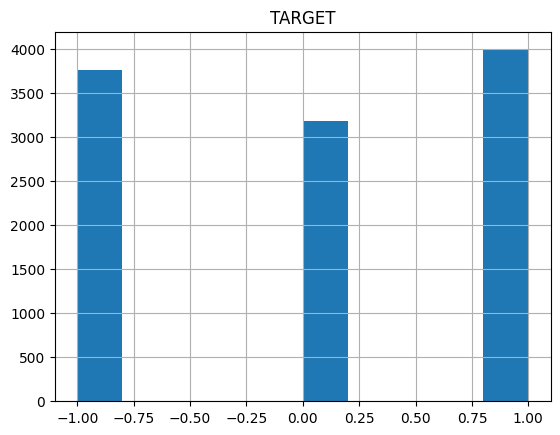

In [47]:
idx_home=np.where(Y_train['TARGET'] == 1)[0]
idx_away=np.where(Y_train['TARGET'] ==-1)[0]
idx_draw=np.where(Y_train['TARGET'] == 0)[0]
idx_home_choice=np.random.choice(idx_home,4000)
idx_balance=list(idx_home_choice)+list(idx_away)+list(idx_draw)
Y_train.iloc[idx_balance].hist()

## Je suppose que :

HOME WINS= on a gagne 1
DRAW= on a fait nul 0 
AWAY WINS= on a perdu -1
Probleme de classification avec 3 classes
Mon idee ce serait de faire un LGBM1 avec le dataset away, un autre LGBM2 avec le dataset home recuperer les probabilites de chaque classe ou et faire le classement nous meme en fonction des probabilites.

Ma question c'est plus au sujet du dataset de train, il faut faire un dataset sur les equipes ou un dataset sur les joueurs en essayant de ressortir des caracteristiques globales des joueurs de l'équipe. 

In [48]:
y_map={'0_1':'HOME_WINS','0_0':'DRAW','0_-1':'AWAY_WINS'}

In [49]:
X_train_f, X_val, Y_train_f, Y_val = train_test_split(
     X_data_home_prepoc_nosum_nocorr, Y_train, test_size=0.2, random_state=4)

In [50]:
# clf = lgb.LGBMClassifier()
# clf.fit(X_train_f, Y_train_f)

In [111]:
clf,study=run_study(X_train_f,Y_train_f['TARGET'].values,n_trials=500, n_jobs=2)


[I 2024-03-01 22:19:57,192] A new study created in memory with name: no-name-6a27a514-89e0-4b8a-971b-7f99a975c61b
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 1000] and step=10, but the range is not divisible by `step`. It will be replaced by [1, 991].

[I 2024-03-01 22:20:45,070] Trial 0 finished with value: 0.44147518359580185 and parameters: {'min_data_in_leaf': 351,

[I 2024-03-01 22:24:13,726] Trial 6 finished with value: 0.44787642507672537 and parameters: {'min_data_in_leaf': 501, 'min_gain_to_split': 2.3797483739276446, 'num_leaves': 255, 'learning_rate': 0.08852701945850973, 'max_depth': 15, 'min_child_samples': 166, 'n_estimators': 471}. Best is trial 6 with value: 0.44787642507672537.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by 

[I 2024-03-01 22:54:00,341] Trial 16 finished with value: 0.45194113537031344 and parameters: {'min_data_in_leaf': 801, 'min_gain_to_split': 9.226547217688118, 'num_leaves': 122, 'learning_rate': 0.008347913129482772, 'max_depth': 13, 'min_child_samples': 197, 'n_estimators': 291}. Best is trial 15 with value: 0.45285552174904115.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified b

[I 2024-03-01 22:55:24,852] Trial 24 finished with value: 0.44807926416322275 and parameters: {'min_data_in_leaf': 651, 'min_gain_to_split': 11.761092264710687, 'num_leaves': 171, 'learning_rate': 0.018210941561693478, 'max_depth': 10, 'min_child_samples': 177, 'n_estimators': 111}. Best is trial 15 with value: 0.45285552174904115.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified 

[I 2024-03-01 23:17:07,537] Trial 31 finished with value: 0.4402561256413052 and parameters: {'min_data_in_leaf': 1101, 'min_gain_to_split': 20.36212563205066, 'num_leaves': 11, 'learning_rate': 0.06048765169278303, 'max_depth': 8, 'min_child_samples': 33, 'n_estimators': 591}. Best is trial 29 with value: 0.4551918877579674.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1,

[I 2024-03-01 23:24:37,922] Trial 39 finished with value: 0.44868972226902276 and parameters: {'min_data_in_leaf': 551, 'min_gain_to_split': 13.968304914654155, 'num_leaves': 65, 'learning_rate': 0.09829624448171756, 'max_depth': 7, 'min_child_samples': 25, 'n_estimators': 731}. Best is trial 32 with value: 0.45549717875277085.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [

[I 2024-03-01 23:36:34,626] Trial 47 finished with value: 0.43456614239039587 and parameters: {'min_data_in_leaf': 901, 'min_gain_to_split': 49.519847593176024, 'num_leaves': 788, 'learning_rate': 0.02202706525680025, 'max_depth': 9, 'min_child_samples': 64, 'n_estimators': 471}. Best is trial 42 with value: 0.4554975916987939.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [

[I 2024-03-02 03:59:50,970] Trial 55 finished with value: 0.45061966680211296 and parameters: {'min_data_in_leaf': 1101, 'min_gain_to_split': 12.363427919486142, 'num_leaves': 51, 'learning_rate': 0.05113575624924462, 'max_depth': 10, 'min_child_samples': 35, 'n_estimators': 391}. Best is trial 42 with value: 0.4554975916987939.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by 

[I 2024-03-02 06:26:17,355] Trial 63 finished with value: 0.4529573955329151 and parameters: {'min_data_in_leaf': 1201, 'min_gain_to_split': 8.33395526845307, 'num_leaves': 183, 'learning_rate': 0.09824293155115942, 'max_depth': 9, 'min_child_samples': 68, 'n_estimators': 851}. Best is trial 42 with value: 0.4554975916987939.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1,

[I 2024-03-02 06:32:20,250] Trial 71 finished with value: 0.4525502307542376 and parameters: {'min_data_in_leaf': 1951, 'min_gain_to_split': 6.723070906674206, 'num_leaves': 152, 'learning_rate': 0.05281269365034039, 'max_depth': 9, 'min_child_samples': 93, 'n_estimators': 761}. Best is trial 42 with value: 0.4554975916987939.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1

[I 2024-03-02 06:38:03,361] Trial 80 finished with value: 0.43456614239039587 and parameters: {'min_data_in_leaf': 1001, 'min_gain_to_split': 26.649487714397896, 'num_leaves': 619, 'learning_rate': 0.027486736638517185, 'max_depth': 9, 'min_child_samples': 157, 'n_estimators': 421}. Best is trial 42 with value: 0.4554975916987939.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified b

[I 2024-03-02 06:43:37,459] Trial 86 finished with value: 0.45681802790193693 and parameters: {'min_data_in_leaf': 1251, 'min_gain_to_split': 5.890526737152088, 'num_leaves': 24, 'learning_rate': 0.045787091527558284, 'max_depth': 8, 'min_child_samples': 89, 'n_estimators': 811}. Best is trial 86 with value: 0.45681802790193693.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by 

[I 2024-03-02 06:48:07,387] Trial 96 finished with value: 0.4523471026055242 and parameters: {'min_data_in_leaf': 1251, 'min_gain_to_split': 9.729179916789064, 'num_leaves': 96, 'learning_rate': 0.03953299951099057, 'max_depth': 11, 'min_child_samples': 93, 'n_estimators': 381}. Best is trial 86 with value: 0.45681802790193693.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [

[I 2024-03-02 06:52:45,649] Trial 103 finished with value: 0.4542777904414558 and parameters: {'min_data_in_leaf': 1101, 'min_gain_to_split': 4.780164065365263, 'num_leaves': 14, 'learning_rate': 0.03510633920901446, 'max_depth': 8, 'min_child_samples': 67, 'n_estimators': 841}. Best is trial 86 with value: 0.45681802790193693.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [

[I 2024-03-02 06:56:44,916] Trial 112 finished with value: 0.45519271365001335 and parameters: {'min_data_in_leaf': 1051, 'min_gain_to_split': 7.059053757300395, 'num_leaves': 63, 'learning_rate': 0.0741456662176668, 'max_depth': 8, 'min_child_samples': 53, 'n_estimators': 521}. Best is trial 86 with value: 0.45681802790193693.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [

[I 2024-03-02 06:59:02,415] Trial 120 finished with value: 0.4514324271645805 and parameters: {'min_data_in_leaf': 1251, 'min_gain_to_split': 10.621327918306687, 'num_leaves': 192, 'learning_rate': 0.03497778058336053, 'max_depth': 9, 'min_child_samples': 91, 'n_estimators': 71}. Best is trial 86 with value: 0.45681802790193693.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by 

[I 2024-03-02 07:01:24,097] Trial 127 finished with value: 0.4531601520302079 and parameters: {'min_data_in_leaf': 1401, 'min_gain_to_split': 3.897192785639847, 'num_leaves': 75, 'learning_rate': 0.020094305533037628, 'max_depth': 9, 'min_child_samples': 62, 'n_estimators': 321}. Best is trial 86 with value: 0.45681802790193693.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by 

[I 2024-03-02 07:04:03,626] Trial 134 finished with value: 0.4534652365519998 and parameters: {'min_data_in_leaf': 1201, 'min_gain_to_split': 7.205438998078165, 'num_leaves': 47, 'learning_rate': 0.014701989465129255, 'max_depth': 10, 'min_child_samples': 57, 'n_estimators': 221}. Best is trial 86 with value: 0.45681802790193693.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by

[I 2024-03-02 07:06:13,199] Trial 142 finished with value: 0.4535667386844531 and parameters: {'min_data_in_leaf': 1151, 'min_gain_to_split': 8.351436651105654, 'num_leaves': 89, 'learning_rate': 0.008164504302524696, 'max_depth': 10, 'min_child_samples': 70, 'n_estimators': 391}. Best is trial 86 with value: 0.45681802790193693.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by

[I 2024-03-02 07:08:53,273] Trial 151 finished with value: 0.4507214579967823 and parameters: {'min_data_in_leaf': 1001, 'min_gain_to_split': 9.407067807393148, 'num_leaves': 93, 'learning_rate': 0.05329119826803349, 'max_depth': 9, 'min_child_samples': 75, 'n_estimators': 301}. Best is trial 86 with value: 0.45681802790193693.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [

[I 2024-03-02 07:11:19,894] Trial 159 finished with value: 0.45549713745816856 and parameters: {'min_data_in_leaf': 1251, 'min_gain_to_split': 4.725875469907429, 'num_leaves': 22, 'learning_rate': 0.017494827948443276, 'max_depth': 8, 'min_child_samples': 73, 'n_estimators': 411}. Best is trial 86 with value: 0.45681802790193693.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by

[I 2024-03-02 07:15:17,329] Trial 167 finished with value: 0.4522460547136963 and parameters: {'min_data_in_leaf': 1301, 'min_gain_to_split': 0.20581381069294924, 'num_leaves': 74, 'learning_rate': 0.01504900201656086, 'max_depth': 7, 'min_child_samples': 79, 'n_estimators': 361}. Best is trial 86 with value: 0.45681802790193693.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by

[I 2024-03-02 07:19:03,750] Trial 175 finished with value: 0.45366815822770173 and parameters: {'min_data_in_leaf': 1251, 'min_gain_to_split': 1.8733338132187898, 'num_leaves': 56, 'learning_rate': 0.009778233421148586, 'max_depth': 8, 'min_child_samples': 100, 'n_estimators': 381}. Best is trial 86 with value: 0.45681802790193693.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified 

[I 2024-03-02 07:22:38,478] Trial 183 finished with value: 0.4537701146007803 and parameters: {'min_data_in_leaf': 1201, 'min_gain_to_split': 2.695982059588271, 'num_leaves': 313, 'learning_rate': 0.01845286001180772, 'max_depth': 8, 'min_child_samples': 83, 'n_estimators': 411}. Best is trial 86 with value: 0.45681802790193693.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by 

[I 2024-03-02 07:25:29,214] Trial 191 finished with value: 0.4539732014548914 and parameters: {'min_data_in_leaf': 1301, 'min_gain_to_split': 3.841290508671909, 'num_leaves': 402, 'learning_rate': 0.022120422864054797, 'max_depth': 8, 'min_child_samples': 103, 'n_estimators': 301}. Best is trial 86 with value: 0.45681802790193693.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified b

[I 2024-03-02 07:28:42,978] Trial 199 finished with value: 0.4517375942755771 and parameters: {'min_data_in_leaf': 1251, 'min_gain_to_split': 2.6392562271827744, 'num_leaves': 26, 'learning_rate': 0.011703934220559596, 'max_depth': 8, 'min_child_samples': 92, 'n_estimators': 431}. Best is trial 86 with value: 0.45681802790193693.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by

[I 2024-03-02 07:32:10,646] Trial 208 finished with value: 0.44960365440712513 and parameters: {'min_data_in_leaf': 1301, 'min_gain_to_split': 2.039469031115009, 'num_leaves': 17, 'learning_rate': 0.008638467656666744, 'max_depth': 7, 'min_child_samples': 100, 'n_estimators': 161}. Best is trial 86 with value: 0.45681802790193693.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified b

[I 2024-03-02 07:35:07,677] Trial 215 finished with value: 0.4515346725998751 and parameters: {'min_data_in_leaf': 1301, 'min_gain_to_split': 5.156865762319497, 'num_leaves': 40, 'learning_rate': 0.0050495866978068306, 'max_depth': 8, 'min_child_samples': 88, 'n_estimators': 401}. Best is trial 86 with value: 0.45681802790193693.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by

[I 2024-03-02 07:37:50,499] Trial 222 finished with value: 0.4563096087584199 and parameters: {'min_data_in_leaf': 1251, 'min_gain_to_split': 4.988554229303845, 'num_leaves': 2, 'learning_rate': 0.016952371903811582, 'max_depth': 8, 'min_child_samples': 96, 'n_estimators': 411}. Best is trial 86 with value: 0.45681802790193693.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [

[I 2024-03-02 07:40:27,950] Trial 231 finished with value: 0.4534654843196136 and parameters: {'min_data_in_leaf': 1351, 'min_gain_to_split': 4.228043922038825, 'num_leaves': 59, 'learning_rate': 0.007220220727110509, 'max_depth': 8, 'min_child_samples': 92, 'n_estimators': 421}. Best is trial 86 with value: 0.45681802790193693.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by 

[I 2024-03-02 07:43:20,649] Trial 239 finished with value: 0.4541763296036049 and parameters: {'min_data_in_leaf': 1301, 'min_gain_to_split': 3.8937058155966913, 'num_leaves': 99, 'learning_rate': 0.014011064645803113, 'max_depth': 8, 'min_child_samples': 106, 'n_estimators': 411}. Best is trial 86 with value: 0.45681802790193693.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified b

[I 2024-03-02 07:46:11,535] Trial 247 finished with value: 0.45397344922250527 and parameters: {'min_data_in_leaf': 1301, 'min_gain_to_split': 5.962705574470805, 'num_leaves': 34, 'learning_rate': 0.013740569204239852, 'max_depth': 8, 'min_child_samples': 126, 'n_estimators': 431}. Best is trial 86 with value: 0.45681802790193693.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified b

[I 2024-03-02 07:48:36,103] Trial 254 finished with value: 0.4524488525055913 and parameters: {'min_data_in_leaf': 1401, 'min_gain_to_split': 3.3766095185274265, 'num_leaves': 59, 'learning_rate': 0.014836665364126448, 'max_depth': 8, 'min_child_samples': 110, 'n_estimators': 481}. Best is trial 86 with value: 0.45681802790193693.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified b

[I 2024-03-02 07:51:21,983] Trial 263 finished with value: 0.455395594031113 and parameters: {'min_data_in_leaf': 1251, 'min_gain_to_split': 5.543419062687291, 'num_leaves': 78, 'learning_rate': 0.019656840434252115, 'max_depth': 8, 'min_child_samples': 129, 'n_estimators': 501}. Best is trial 86 with value: 0.45681802790193693.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by 

[I 2024-03-02 07:54:23,797] Trial 270 finished with value: 0.4548875465390168 and parameters: {'min_data_in_leaf': 1301, 'min_gain_to_split': 4.063775255836262, 'num_leaves': 48, 'learning_rate': 0.008363864974145508, 'max_depth': 8, 'min_child_samples': 121, 'n_estimators': 401}. Best is trial 86 with value: 0.45681802790193693.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by

[I 2024-03-02 07:57:25,741] Trial 278 finished with value: 0.4529569825868921 and parameters: {'min_data_in_leaf': 1301, 'min_gain_to_split': 7.873739691934116, 'num_leaves': 131, 'learning_rate': 0.009400973873641855, 'max_depth': 7, 'min_child_samples': 97, 'n_estimators': 491}. Best is trial 275 with value: 0.45681815178574375.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified b

[I 2024-03-02 08:00:32,938] Trial 288 finished with value: 0.45417604054138877 and parameters: {'min_data_in_leaf': 1301, 'min_gain_to_split': 6.847013309577272, 'num_leaves': 2, 'learning_rate': 0.01441508119587229, 'max_depth': 8, 'min_child_samples': 107, 'n_estimators': 391}. Best is trial 275 with value: 0.45681815178574375.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by

[I 2024-03-02 08:03:04,305] Trial 294 finished with value: 0.43456614239039587 and parameters: {'min_data_in_leaf': 1351, 'min_gain_to_split': 4.946050880445469, 'num_leaves': 74, 'learning_rate': 0.00014057716394923553, 'max_depth': 6, 'min_child_samples': 86, 'n_estimators': 361}. Best is trial 275 with value: 0.45681815178574375.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified

[I 2024-03-02 08:04:59,749] Trial 303 finished with value: 0.45448091859016926 and parameters: {'min_data_in_leaf': 1151, 'min_gain_to_split': 7.338592059899119, 'num_leaves': 2, 'learning_rate': 0.01680149196704386, 'max_depth': 8, 'min_child_samples': 117, 'n_estimators': 421}. Best is trial 275 with value: 0.45681815178574375.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by

[I 2024-03-02 08:07:12,879] Trial 311 finished with value: 0.4552940093094552 and parameters: {'min_data_in_leaf': 1201, 'min_gain_to_split': 5.813795769519932, 'num_leaves': 21, 'learning_rate': 0.02494161297552338, 'max_depth': 8, 'min_child_samples': 91, 'n_estimators': 441}. Best is trial 275 with value: 0.45681815178574375.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by 

[I 2024-03-02 08:09:52,159] Trial 319 finished with value: 0.43456614239039587 and parameters: {'min_data_in_leaf': 1201, 'min_gain_to_split': 3.6679729395121803, 'num_leaves': 2, 'learning_rate': 0.0015588443697641102, 'max_depth': 8, 'min_child_samples': 86, 'n_estimators': 231}. Best is trial 275 with value: 0.45681815178574375.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified 

[I 2024-03-02 08:12:41,596] Trial 327 finished with value: 0.45407507523876534 and parameters: {'min_data_in_leaf': 1301, 'min_gain_to_split': 2.3533739637723925, 'num_leaves': 688, 'learning_rate': 0.011186138194769832, 'max_depth': 8, 'min_child_samples': 108, 'n_estimators': 331}. Best is trial 275 with value: 0.45681815178574375.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specifie

[I 2024-03-02 08:15:33,820] Trial 334 finished with value: 0.4540749513549585 and parameters: {'min_data_in_leaf': 1101, 'min_gain_to_split': 4.71362420073043, 'num_leaves': 22, 'learning_rate': 0.012998390105946079, 'max_depth': 11, 'min_child_samples': 77, 'n_estimators': 361}. Best is trial 275 with value: 0.45681815178574375.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by

[I 2024-03-02 08:19:10,837] Trial 343 finished with value: 0.45539567662031766 and parameters: {'min_data_in_leaf': 1251, 'min_gain_to_split': 6.229370871294609, 'num_leaves': 158, 'learning_rate': 0.018944903821243985, 'max_depth': 12, 'min_child_samples': 194, 'n_estimators': 541}. Best is trial 275 with value: 0.45681815178574375.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specifie

[I 2024-03-02 08:21:49,405] Trial 351 finished with value: 0.4522456830622756 and parameters: {'min_data_in_leaf': 1651, 'min_gain_to_split': 3.822730032478955, 'num_leaves': 223, 'learning_rate': 0.02879709545142568, 'max_depth': 9, 'min_child_samples': 102, 'n_estimators': 461}. Best is trial 275 with value: 0.45681815178574375.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified b

[I 2024-03-02 08:24:19,228] Trial 359 finished with value: 0.4391384872300572 and parameters: {'min_data_in_leaf': 1351, 'min_gain_to_split': 21.142552391803505, 'num_leaves': 110, 'learning_rate': 0.005213219797643823, 'max_depth': 7, 'min_child_samples': 111, 'n_estimators': 501}. Best is trial 275 with value: 0.45681815178574375.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified

[I 2024-03-02 08:27:00,805] Trial 368 finished with value: 0.45498913126067464 and parameters: {'min_data_in_leaf': 1201, 'min_gain_to_split': 4.16373885774719, 'num_leaves': 17, 'learning_rate': 0.010344408651983439, 'max_depth': 8, 'min_child_samples': 115, 'n_estimators': 341}. Best is trial 275 with value: 0.45681815178574375.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified b

[I 2024-03-02 08:29:30,807] Trial 375 finished with value: 0.4496044390045688 and parameters: {'min_data_in_leaf': 1151, 'min_gain_to_split': 2.180790595403602, 'num_leaves': 41, 'learning_rate': 0.01719815053258497, 'max_depth': 8, 'min_child_samples': 108, 'n_estimators': 321}. Best is trial 275 with value: 0.45681815178574375.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by

[I 2024-03-02 08:31:12,810] Trial 383 finished with value: 0.456005350128674 and parameters: {'min_data_in_leaf': 1251, 'min_gain_to_split': 5.554689620634533, 'num_leaves': 106, 'learning_rate': 0.026330343937243893, 'max_depth': 10, 'min_child_samples': 146, 'n_estimators': 301}. Best is trial 275 with value: 0.45681815178574375.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified 

[I 2024-03-02 08:32:47,872] Trial 391 finished with value: 0.45153425965385213 and parameters: {'min_data_in_leaf': 1901, 'min_gain_to_split': 4.495717251596734, 'num_leaves': 451, 'learning_rate': 0.01660413559150474, 'max_depth': 10, 'min_child_samples': 67, 'n_estimators': 211}. Best is trial 275 with value: 0.45681815178574375.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified 

[I 2024-03-02 08:35:12,528] Trial 399 finished with value: 0.4543794577523183 and parameters: {'min_data_in_leaf': 1201, 'min_gain_to_split': 3.9149600971049643, 'num_leaves': 77, 'learning_rate': 0.01883925464298185, 'max_depth': 8, 'min_child_samples': 102, 'n_estimators': 431}. Best is trial 275 with value: 0.45681815178574375.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified b

[I 2024-03-02 08:38:39,236] Trial 407 finished with value: 0.45336402348176263 and parameters: {'min_data_in_leaf': 1151, 'min_gain_to_split': 2.9195440999877413, 'num_leaves': 83, 'learning_rate': 0.015637219563750717, 'max_depth': 8, 'min_child_samples': 105, 'n_estimators': 581}. Best is trial 275 with value: 0.45681815178574375.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified

[I 2024-03-02 08:41:35,562] Trial 415 finished with value: 0.45214397445681076 and parameters: {'min_data_in_leaf': 1351, 'min_gain_to_split': 3.960882799444303, 'num_leaves': 101, 'learning_rate': 0.01778785536110881, 'max_depth': 8, 'min_child_samples': 72, 'n_estimators': 441}. Best is trial 275 with value: 0.45681815178574375.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified b

[I 2024-03-02 08:44:11,020] Trial 423 finished with value: 0.43456614239039587 and parameters: {'min_data_in_leaf': 1101, 'min_gain_to_split': 6.930684650162352, 'num_leaves': 34, 'learning_rate': 0.002641865316074211, 'max_depth': 8, 'min_child_samples': 101, 'n_estimators': 251}. Best is trial 275 with value: 0.45681815178574375.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified 

[I 2024-03-02 08:46:37,252] Trial 432 finished with value: 0.4537701558953826 and parameters: {'min_data_in_leaf': 1151, 'min_gain_to_split': 3.0434632880942187, 'num_leaves': 78, 'learning_rate': 0.020213805725678956, 'max_depth': 6, 'min_child_samples': 96, 'n_estimators': 281}. Best is trial 275 with value: 0.45681815178574375.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified b

[I 2024-03-02 08:49:24,145] Trial 439 finished with value: 0.45397324274949374 and parameters: {'min_data_in_leaf': 1301, 'min_gain_to_split': 6.4408212348085065, 'num_leaves': 91, 'learning_rate': 0.012367629384942543, 'max_depth': 7, 'min_child_samples': 96, 'n_estimators': 371}. Best is trial 275 with value: 0.45681815178574375.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified 

[I 2024-03-02 08:51:13,188] Trial 446 finished with value: 0.45214393316220847 and parameters: {'min_data_in_leaf': 1401, 'min_gain_to_split': 7.702707461721184, 'num_leaves': 207, 'learning_rate': 0.013740958532647294, 'max_depth': 9, 'min_child_samples': 93, 'n_estimators': 391}. Best is trial 275 with value: 0.45681815178574375.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified 

[I 2024-03-02 08:53:21,165] Trial 454 finished with value: 0.45519263106080876 and parameters: {'min_data_in_leaf': 1151, 'min_gain_to_split': 4.343457968941415, 'num_leaves': 64, 'learning_rate': 0.012196154261239189, 'max_depth': 5, 'min_child_samples': 96, 'n_estimators': 481}. Best is trial 275 with value: 0.45681815178574375.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified b

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 1000] and step=10, but the range is not divisible by `step`. It will be replaced by [1, 991].

[I 2024-03-02 08:56:09,321] Trial 463 finished with value: 0.4515344248322613 and parameters: {'min_data_in_leaf': 1351, 'min_gain_to_split': 3.299918541071602, 'num_leaves': 36, 'learning_rate': 0.0114130202428763, 'max_depth': 8, 

[I 2024-03-02 08:58:55,423] Trial 472 finished with value: 0.4551923007039904 and parameters: {'min_data_in_leaf': 1251, 'min_gain_to_split': 5.749508148989891, 'num_leaves': 55, 'learning_rate': 0.016172891541714102, 'max_depth': 6, 'min_child_samples': 90, 'n_estimators': 391}. Best is trial 275 with value: 0.45681815178574375.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 1000] and step=10, but the range is not divisible by `step`. It will be replaced by [1, 991].

[I 2024-03-02 09:01:41,043] Trial 479 finished with value: 0.4574275362318841 and parameters: {'min_data_in_leaf': 1201, 'min_gain_to_split': 5.3322377480829815, 'num_leaves': 3, 'learning_rate': 0.01769176744189809, 'max_depth': 8,

[I 2024-03-02 09:03:14,690] Trial 486 finished with value: 0.4404597493252462 and parameters: {'min_data_in_leaf': 1101, 'min_gain_to_split': 1.2340045782551723, 'num_leaves': 18, 'learning_rate': 0.03628600669055861, 'max_depth': 9, 'min_child_samples': 164, 'n_estimators': 461}. Best is trial 479 with value: 0.4574275362318841.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by

[I 2024-03-02 09:07:06,784] Trial 494 finished with value: 0.45387157543863127 and parameters: {'min_data_in_leaf': 1301, 'min_gain_to_split': 4.631576642221282, 'num_leaves': 23, 'learning_rate': 0.016019979978014052, 'max_depth': 7, 'min_child_samples': 98, 'n_estimators': 561}. Best is trial 479 with value: 0.4574275362318841.
/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [1, 2000] and step=50, but the range is not divisible by `step`. It will be replaced by [1, 1951].

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/Users/jordan/anaconda3/envs/challengeQRT/lib/python3.12/site-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by

Best params: {'min_data_in_leaf': 1201, 'min_gain_to_split': 5.3322377480829815, 'num_leaves': 3, 'learning_rate': 0.01769176744189809, 'max_depth': 8, 'min_child_samples': 93, 'n_estimators': 501, 'verbosity': -1}
Study statistics: 
  Number of finished trials:  500
Best trial:
  Value:  0.4574275362318841
  Params: 
    min_data_in_leaf: 1201
    min_gain_to_split: 5.3322377480829815
    num_leaves: 3
    learning_rate: 0.01769176744189809
    max_depth: 8
    min_child_samples: 93
    n_estimators: 501


In [102]:
# Get feature importances
feature_importances = clf.feature_importances_

# Create a dictionary of feature names and their importances
feature_importance_dict = dict(zip(X_train_f.columns, feature_importances))

# Sort the dictionary by importance value in descending order
sorted_feature_importance = sorted(feature_importance_dict.items(), key=lambda x: x[1], reverse=True)

# Get the top n features importances
top_n = 70  # Change this to the number of top features you want
top_n_features_importances = sorted_feature_importance[:top_n]

# Print or use the top n features importances
print("Top {} features importances:".format(top_n))
for feature, importance in top_n_features_importances:
    print("{}: {}".format(feature, importance))


Top 70 features importances:
PLAYER_BIG_CHANCES_MISSED_season_average: 44
PLAYER_GOALS_season_average: 36
TEAM_GAME_WON_season_average: 33
TEAM_GAME_LOST_season_average: 29
TEAM_BALL_POSSESSION_season_average: 27
PLAYER_GOALS_CONCEDED_season_average: 26
PLAYER_CLEARANCES_season_average: 24
TEAM_SHOTS_TOTAL_season_average: 23
TEAM_DANGEROUS_ATTACKS_season_average: 22
TEAM_SAVES_season_average: 18
TEAM_SUCCESSFUL_PASSES_season_average: 16
TEAM_CORNERS_5_last_match_average: 16
TEAM_CORNERS_season_std: 14
PLAYER_ASSISTS_5_last_match_average: 14
TEAM_SHOTS_INSIDEBOX_season_average: 12
TEAM_GOALS_season_average: 12
PLAYER_ACCURATE_CROSSES_season_std: 12
PLAYER_ASSISTS_season_std: 12
TEAM_CORNERS_season_average: 11
TEAM_SUCCESSFUL_PASSES_PERCENTAGE_season_average: 10
TEAM_DANGEROUS_ATTACKS_5_last_match_average: 10
PLAYER_HIT_WOODWORK_season_average: 10
PLAYER_SAVES_INSIDE_BOX_5_last_match_std: 10
PLAYER_GOALS_CONCEDED_5_last_match_average: 9
TEAM_SHOTS_ON_TARGET_season_average: 7
TEAM_SHOTS_O

In [106]:
clf_70,study_70=run_study(X_train_f[[col[0] for col in top_n_features_importances]],Y_train_f['TARGET'].values,n_trials=50, n_jobs=2)


[I 2024-03-01 21:12:06,203] A new study created in memory with name: no-name-2a4f4909-d1a6-42fd-8a27-46e5eab575df
/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.005, 0.5),  # Adjusted for smaller dataset
/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:30: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'reg_alpha': trial.suggest_loguniform('reg_alpha', 1e-5, 1),
/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0

/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.005, 0.5),  # Adjusted for smaller dataset
/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:30: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'reg_alpha': trial.suggest_loguniform('reg_alpha', 1e-5, 1),
[I 2024-03-01 21:12:42,030] Trial 7 finished with value: 0.45295661093547135 and parameters: {'min_data_in_leaf': 1000, 'min_gain_to_split': 9.10186921814138, 'num_leaves': 494, 'learning_rate': 0.1792917905671543, 'max_depth': 11, 'min_child_samples': 81, 'reg_alpha': 0.0007311221922

[I 2024-03-01 21:16:01,652] Trial 15 finished with value: 0.45153384670782915 and parameters: {'min_data_in_leaf': 100, 'min_gain_to_split': 6.034174616603043, 'num_leaves': 238, 'learning_rate': 0.022816512073259958, 'max_depth': 10, 'min_child_samples': 66, 'reg_alpha': 8.596262126185118e-05, 'n_estimators': 800}. Best is trial 3 with value: 0.457122162647876.
/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.005, 0.5),  # Adjusted for smaller dataset
/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:30: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., lo

[I 2024-03-01 21:23:15,280] Trial 23 finished with value: 0.4520413986646977 and parameters: {'min_data_in_leaf': 150, 'min_gain_to_split': 3.423908100839013, 'num_leaves': 131, 'learning_rate': 0.19778486399219886, 'max_depth': 12, 'min_child_samples': 67, 'reg_alpha': 3.6647319464153715e-05, 'n_estimators': 900}. Best is trial 3 with value: 0.457122162647876.
/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.005, 0.5),  # Adjusted for smaller dataset
/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:30: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log

[I 2024-03-01 21:28:58,108] Trial 30 finished with value: 0.44137351628493937 and parameters: {'min_data_in_leaf': 150, 'min_gain_to_split': 2.471801498465291, 'num_leaves': 204, 'learning_rate': 0.47787290081155864, 'max_depth': 15, 'min_child_samples': 75, 'reg_alpha': 0.006900681824472062, 'n_estimators': 770}. Best is trial 3 with value: 0.457122162647876.
/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.005, 0.5),  # Adjusted for smaller dataset
/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:30: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=

[I 2024-03-01 21:30:17,964] Trial 38 finished with value: 0.4550902617417072 and parameters: {'min_data_in_leaf': 800, 'min_gain_to_split': 3.7063492072445787, 'num_leaves': 442, 'learning_rate': 0.06838108303869438, 'max_depth': 7, 'min_child_samples': 69, 'reg_alpha': 0.2889699886001235, 'n_estimators': 540}. Best is trial 3 with value: 0.457122162647876.
/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.005, 0.5),  # Adjusted for smaller dataset
/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:30: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=Tru

[I 2024-03-01 21:31:59,893] Trial 46 finished with value: 0.44696207999259996 and parameters: {'min_data_in_leaf': 200, 'min_gain_to_split': 2.02713607425333, 'num_leaves': 997, 'learning_rate': 0.021417638768951714, 'max_depth': 12, 'min_child_samples': 78, 'reg_alpha': 5.8097452397341285e-05, 'n_estimators': 850}. Best is trial 3 with value: 0.457122162647876.
/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:27: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.005, 0.5),  # Adjusted for smaller dataset
/Users/jordan/Documents/MVA/challengeQ/hyperparameter_tuning.py:30: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., lo

Best params: {'min_data_in_leaf': 50, 'min_gain_to_split': 3.2658832582575656, 'num_leaves': 80, 'learning_rate': 0.12714402473189343, 'max_depth': 8, 'min_child_samples': 73, 'reg_alpha': 0.33991915611541174, 'n_estimators': 940, 'verbosity': -1}
Study statistics: 
  Number of finished trials:  50
Best trial:
  Value:  0.457122162647876
  Params: 
    min_data_in_leaf: 50
    min_gain_to_split: 3.2658832582575656
    num_leaves: 80
    learning_rate: 0.12714402473189343
    max_depth: 8
    min_child_samples: 73
    reg_alpha: 0.33991915611541174
    n_estimators: 940


In [107]:
np.sum(clf_70.predict(X_val[[col[0] for col in top_n_features_importances]])==Y_val['TARGET'])/len(Y_val)

0.4660707029662739

## STUDY PARAMETERS

In [110]:
optuna.visualization.plot_slice(study_70)

In [108]:
y_pred=clf.predict(X_data_home_prepoc_test_nosum_nocorr)

In [62]:
clf.predict_proba(X_data_home_prepoc_test_nosum_nocorr)

array([[0.54909788, 0.24731749, 0.20358463],
       [0.37574936, 0.41698991, 0.20726072],
       [0.17697707, 0.31662303, 0.5063999 ],
       ...,
       [0.20733821, 0.28595039, 0.5067114 ],
       [0.37146479, 0.4849788 , 0.14355641],
       [0.30119478, 0.20545052, 0.4933547 ]])

In [65]:
np.savetxt("home_proba.csv", clf.predict_proba(X_data_home_prepoc_test_nosum_nocorr), delimiter=",")


In [78]:
home_proba=pd.read_csv("home_proba.csv",header=None).values
away_proba=pd.read_csv("away_proba.csv",header=None).values

In [79]:
(home_proba+away_proba)/2

array([[0.42243367, 0.25497371, 0.32259262],
       [0.53145068, 0.27758534, 0.19096398],
       [0.28601489, 0.26228357, 0.45170155],
       ...,
       [0.29906333, 0.34359864, 0.35733804],
       [0.21175028, 0.69124467, 0.09700505],
       [0.50330923, 0.20153235, 0.29515842]])

In [80]:
prediction=np.argmax((home_proba+away_proba)/2,axis=1)-1

In [85]:
y_submission=pd.get_dummies(pd.DataFrame(prediction,index=X_data_home_prepoc_test_nosum_nocorr.index).astype(str),dtype=int).rename(columns=y_map)[['HOME_WINS','DRAW','AWAY_WINS']]


In [86]:
y_submission

,HOME_WINS,DRAW,AWAY_WINS
ID,,,
12303,0,0,1
12304,0,0,1
12305,1,0,0
12306,0,1,0
12307,0,0,1
...,...,...,...
37666,0,1,0
37667,0,0,1
37668,1,0,0


In [91]:
y_submission.to_csv('Y_test_mutual.csv')

False